In [25]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import os

from analysis_utils import get_df, inspect_model_by_name

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import warnings
warnings.filterwarnings('error')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=ImportWarning)

identifier = '*'
df = get_df(identifier)
print('before filtering, there are a total of', len(df), 'models')

before filtering, there are a total of 757 models


In [13]:
from sklearn.cluster import DBSCAN
import numpy as np
metrics = [
    'loss_val_k_3',
    'loss_val_k_4',
    'loss_val_k_5',
    
    'target_anechoic_cyst_5mm_target_1_SNR_10dB_cr_dnn',
    'target_anechoic_cyst_5mm_target_1_SNR_10dB_cnr_dnn',
    'target_anechoic_cyst_5mm_target_1_SNR_10dB_snr_dnn',
    
    'target_anechoic_cyst_5mm_target_2_SNR_10dB_cr_dnn',
    'target_anechoic_cyst_5mm_target_2_SNR_10dB_cnr_dnn',
    'target_anechoic_cyst_5mm_target_2_SNR_10dB_snr_dnn',
    
    'target_anechoic_cyst_5mm_target_3_SNR_10dB_cr_dnn',
    'target_anechoic_cyst_5mm_target_3_SNR_10dB_cnr_dnn',
    'target_anechoic_cyst_5mm_target_3_SNR_10dB_snr_dnn',
    
    'target_anechoic_cyst_5mm_target_4_SNR_10dB_cr_dnn',
    'target_anechoic_cyst_5mm_target_4_SNR_10dB_cnr_dnn',
    'target_anechoic_cyst_5mm_target_4_SNR_10dB_snr_dnn',
    
    'target_anechoic_cyst_5mm_target_5_SNR_10dB_cr_dnn',
    'target_anechoic_cyst_5mm_target_5_SNR_10dB_cnr_dnn',
    'target_anechoic_cyst_5mm_target_5_SNR_10dB_snr_dnn',
    
    
    
    'target_phantom_anechoic_cyst_2p5mm_target_1_cr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_1_cnr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_1_snr_dnn',
    
    'target_phantom_anechoic_cyst_2p5mm_target_2_cr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_2_cnr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_2_snr_dnn',
    
    'target_phantom_anechoic_cyst_2p5mm_target_3_cr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_3_cnr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_3_snr_dnn',
    
    'target_phantom_anechoic_cyst_2p5mm_target_4_cr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_4_cnr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_4_snr_dnn',
    
    'target_phantom_anechoic_cyst_2p5mm_target_5_cr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_5_cnr_dnn',
    'target_phantom_anechoic_cyst_2p5mm_target_5_snr_dnn',
    
    'target_in_vivo_target_17_cr_dnn',
    'target_in_vivo_target_17_cnr_dnn',
    'target_in_vivo_target_17_snr_dnn',
    
    'target_in_vivo_target_19_cr_dnn',
    'target_in_vivo_target_19_cnr_dnn',
    'target_in_vivo_target_19_snr_dnn',
    
]

X = df.loc[:, metrics]
clustering = DBSCAN(eps=3, min_samples=2).fit(X)
labels = clustering.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print('n_clusters_ =', n_clusters_)
# clustering

n_clusters_ = 19


In [5]:
X

,loss_val_k_3,loss_val_k_4,loss_val_k_5,target_anechoic_cyst_5mm_target_1_SNR_10dB_cr_dnn,target_anechoic_cyst_5mm_target_1_SNR_10dB_cnr_dnn,target_anechoic_cyst_5mm_target_1_SNR_10dB_snr_dnn,target_anechoic_cyst_5mm_target_2_SNR_10dB_cr_dnn,target_anechoic_cyst_5mm_target_2_SNR_10dB_cnr_dnn,target_anechoic_cyst_5mm_target_2_SNR_10dB_snr_dnn,target_anechoic_cyst_5mm_target_3_SNR_10dB_cr_dnn,...,target_phantom_anechoic_cyst_2p5mm_target_4_snr_dnn,target_phantom_anechoic_cyst_2p5mm_target_5_cr_dnn,target_phantom_anechoic_cyst_2p5mm_target_5_cnr_dnn,target_phantom_anechoic_cyst_2p5mm_target_5_snr_dnn,target_in_vivo_target_17_cr_dnn,target_in_vivo_target_17_cnr_dnn,target_in_vivo_target_17_snr_dnn,target_in_vivo_target_19_cr_dnn,target_in_vivo_target_19_cnr_dnn,target_in_vivo_target_19_snr_dnn
0,0.022003,0.025377,0.027426,32.4170,4.78180,1.78580,34.5760,4.695900,1.75380,36.04300,...,1.95540,28.1380,4.01800,1.65540,7.86730,-4.5130,1.255400,42.24400,4.75310,1.742600
1,0.030513,0.030799,0.034052,28.4600,4.55290,1.76340,30.4960,4.551200,1.74430,31.31200,...,1.91550,21.1140,3.90440,1.72270,2.05100,-11.9530,1.639900,23.70200,4.99560,1.906000
2,0.141130,0.139232,0.140018,8.4690,2.15730,2.20420,7.5591,1.691400,2.25390,8.71920,...,2.11310,3.6102,-3.89490,2.22220,-3.03270,-6.1410,2.136200,6.00540,-0.88147,2.011600
3,0.044913,0.087073,0.069806,29.3510,4.28830,1.70480,28.9000,4.395200,1.72740,31.78900,...,1.91580,25.4520,3.79870,1.63830,4.78790,-6.2194,1.413900,28.37100,4.55900,1.759200
4,0.033942,0.034668,0.044619,26.5360,4.50400,1.77190,27.7740,4.721700,1.80090,28.78000,...,1.91130,19.6740,3.77690,1.72970,1.04730,-17.5390,1.647900,21.68000,5.10280,1.968800
5,0.071228,0.070452,0.070727,7.9464,0.50089,1.89980,7.4201,-0.104880,1.85060,8.84400,...,1.87500,4.2695,-2.88100,2.20710,-2.95940,-7.1326,1.974100,6.45200,-0.71816,1.927200
6,0.037355,0.040059,0.040786,28.1420,5.10180,1.88350,29.2220,5.213800,1.89410,30.41400,...,2.07220,18.8720,4.83520,1.98150,4.98860,-4.9378,1.793200,24.72800,5.44360,1.997700
7,0.043094,0.049436,0.055907,25.9350,4.96520,1.87940,27.3170,4.961600,1.85770,28.67200,...,2.06360,21.7270,4.56490,1.84730,3.29310,-7.9316,1.617900,22.93200,5.06340,1.934600
8,0.125623,0.140902,0.120906,32.9530,1.61390,1.23260,34.3550,2.156200,1.30690,36.37800,...,1.02760,26.8130,-1.66320,0.86550,2.06860,-19.5070,0.541910,21.35600,-2.74300,0.797850
9,0.048677,0.047785,0.063694,27.4130,3.30470,1.53120,28.1840,3.626700,1.58200,29.16800,...,1.64330,19.6820,2.07400,1.42200,0.56164,-26.8220,1.271300,21.90800,3.28200,1.589800


In [16]:
X['cluster'] = labels

In [17]:
X

,loss_val_k_3,loss_val_k_4,loss_val_k_5,target_anechoic_cyst_5mm_target_1_SNR_10dB_cr_dnn,target_anechoic_cyst_5mm_target_1_SNR_10dB_cnr_dnn,target_anechoic_cyst_5mm_target_1_SNR_10dB_snr_dnn,target_anechoic_cyst_5mm_target_2_SNR_10dB_cr_dnn,target_anechoic_cyst_5mm_target_2_SNR_10dB_cnr_dnn,target_anechoic_cyst_5mm_target_2_SNR_10dB_snr_dnn,target_anechoic_cyst_5mm_target_3_SNR_10dB_cr_dnn,...,target_phantom_anechoic_cyst_2p5mm_target_5_cr_dnn,target_phantom_anechoic_cyst_2p5mm_target_5_cnr_dnn,target_phantom_anechoic_cyst_2p5mm_target_5_snr_dnn,target_in_vivo_target_17_cr_dnn,target_in_vivo_target_17_cnr_dnn,target_in_vivo_target_17_snr_dnn,target_in_vivo_target_19_cr_dnn,target_in_vivo_target_19_cnr_dnn,target_in_vivo_target_19_snr_dnn,cluster
0,0.022003,0.025377,0.027426,32.4170,4.78180,1.78580,34.5760,4.695900,1.75380,36.04300,...,28.1380,4.01800,1.65540,7.86730,-4.5130,1.255400,42.24400,4.75310,1.742600,-1
1,0.030513,0.030799,0.034052,28.4600,4.55290,1.76340,30.4960,4.551200,1.74430,31.31200,...,21.1140,3.90440,1.72270,2.05100,-11.9530,1.639900,23.70200,4.99560,1.906000,0
2,0.141130,0.139232,0.140018,8.4690,2.15730,2.20420,7.5591,1.691400,2.25390,8.71920,...,3.6102,-3.89490,2.22220,-3.03270,-6.1410,2.136200,6.00540,-0.88147,2.011600,1
3,0.044913,0.087073,0.069806,29.3510,4.28830,1.70480,28.9000,4.395200,1.72740,31.78900,...,25.4520,3.79870,1.63830,4.78790,-6.2194,1.413900,28.37100,4.55900,1.759200,-1
4,0.033942,0.034668,0.044619,26.5360,4.50400,1.77190,27.7740,4.721700,1.80090,28.78000,...,19.6740,3.77690,1.72970,1.04730,-17.5390,1.647900,21.68000,5.10280,1.968800,-1
5,0.071228,0.070452,0.070727,7.9464,0.50089,1.89980,7.4201,-0.104880,1.85060,8.84400,...,4.2695,-2.88100,2.20710,-2.95940,-7.1326,1.974100,6.45200,-0.71816,1.927200,1
6,0.037355,0.040059,0.040786,28.1420,5.10180,1.88350,29.2220,5.213800,1.89410,30.41400,...,18.8720,4.83520,1.98150,4.98860,-4.9378,1.793200,24.72800,5.44360,1.997700,0
7,0.043094,0.049436,0.055907,25.9350,4.96520,1.87940,27.3170,4.961600,1.85770,28.67200,...,21.7270,4.56490,1.84730,3.29310,-7.9316,1.617900,22.93200,5.06340,1.934600,0
8,0.125623,0.140902,0.120906,32.9530,1.61390,1.23260,34.3550,2.156200,1.30690,36.37800,...,26.8130,-1.66320,0.86550,2.06860,-19.5070,0.541910,21.35600,-2.74300,0.797850,-1
9,0.048677,0.047785,0.063694,27.4130,3.30470,1.53120,28.1840,3.626700,1.58200,29.16800,...,19.6820,2.07400,1.42200,0.56164,-26.8220,1.271300,21.90800,3.28200,1.589800,-1


In [23]:
negative_1 = df[X['cluster'] == -1]

model 1 of 10 :  20180718164411_37_evaluated


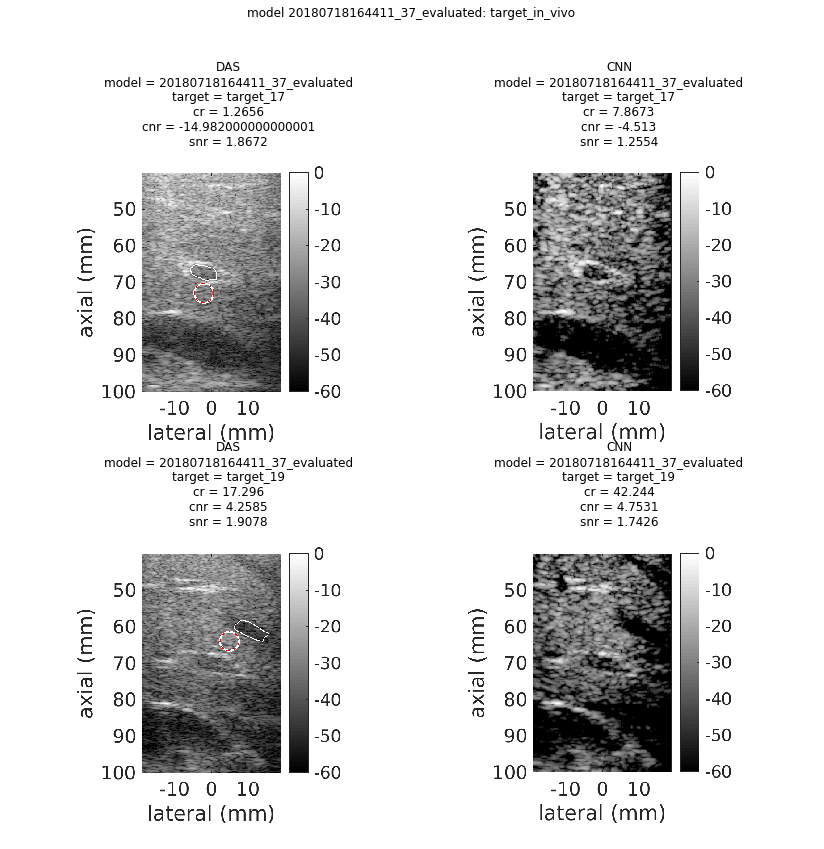

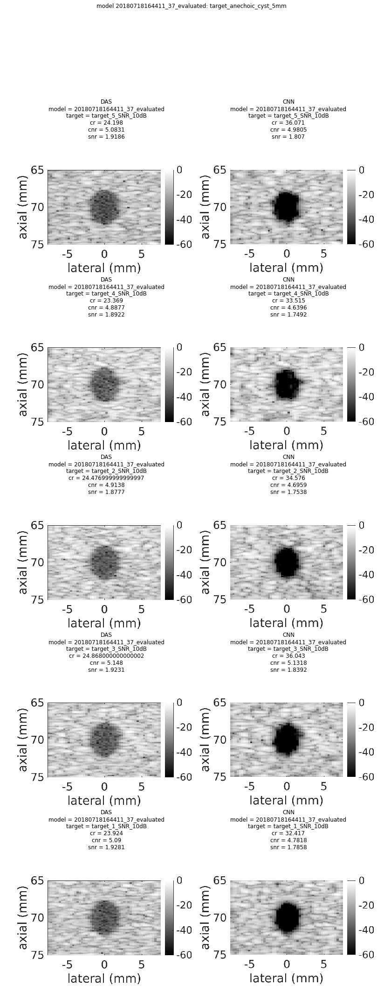

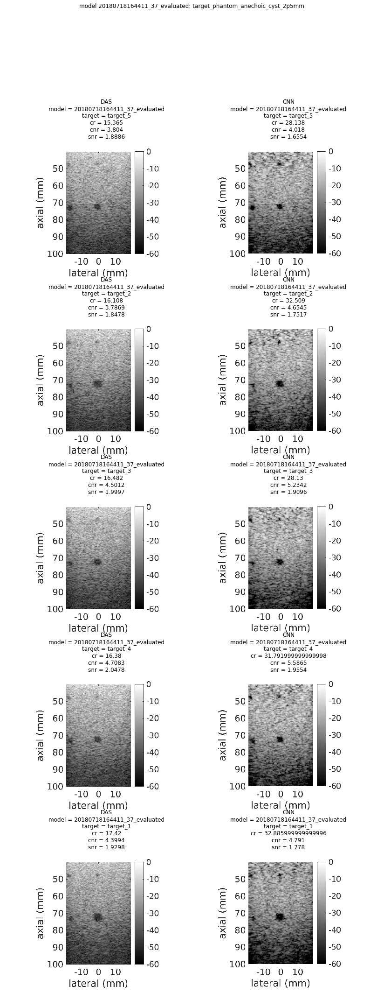





model 2 of 10 :  20181002150342_43_evaluated


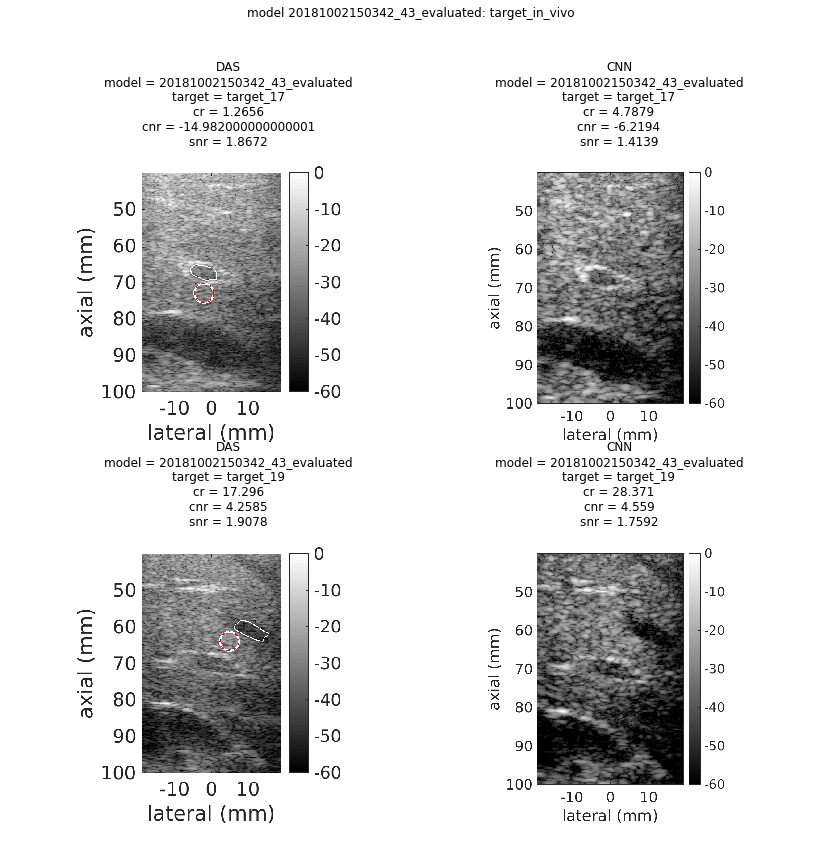

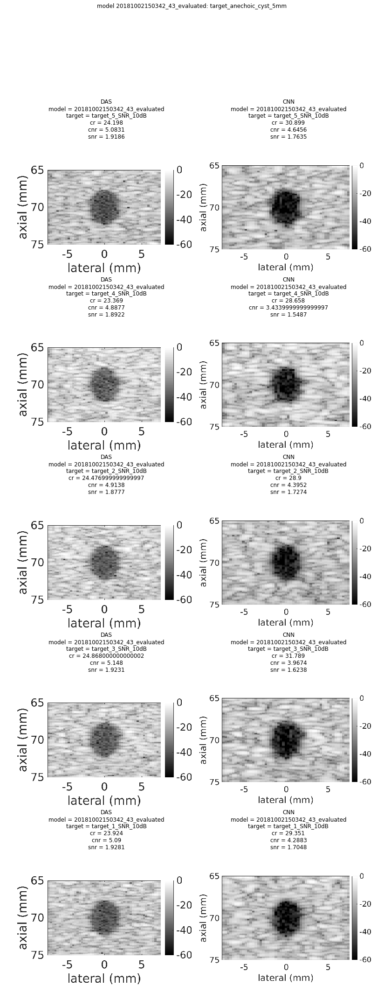

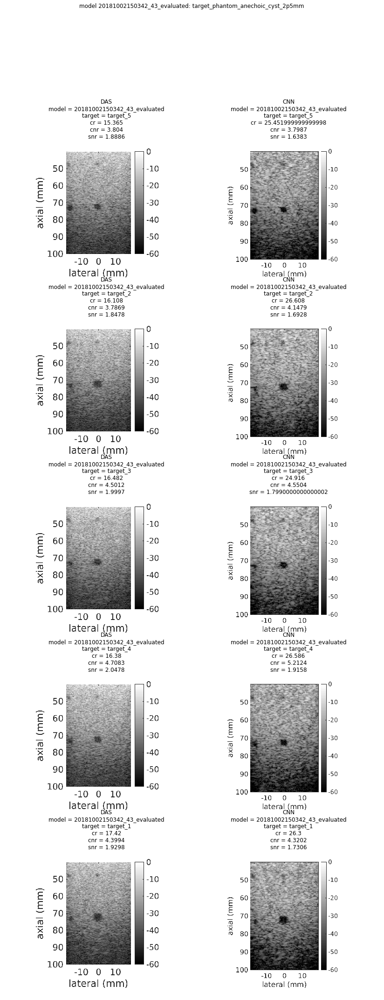





model 3 of 10 :  20180705164352_39_evaluated


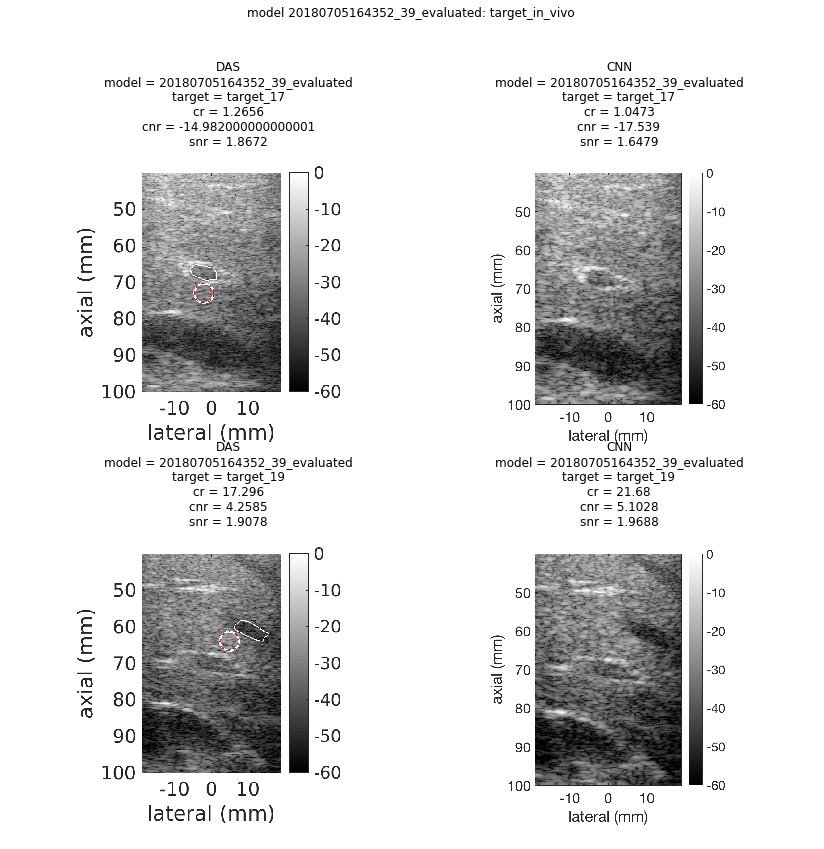

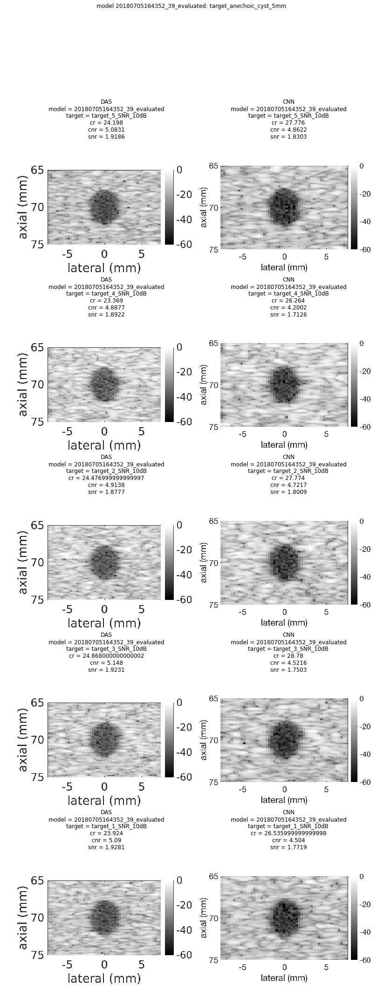

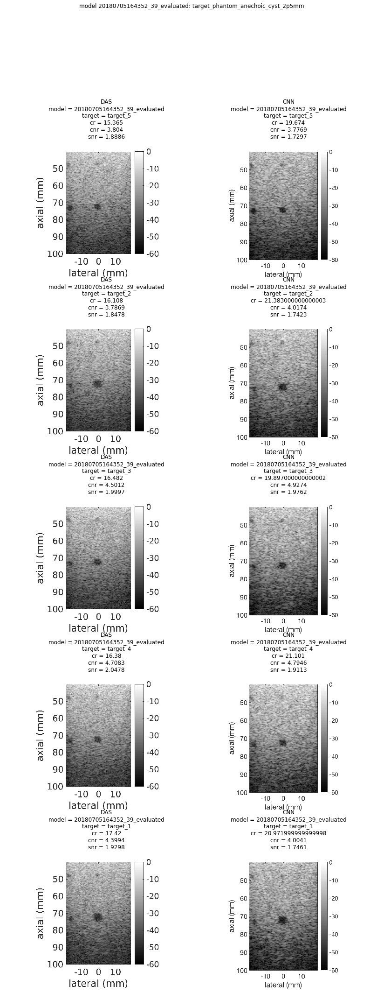





model 4 of 10 :  20180807104900_34_evaluated


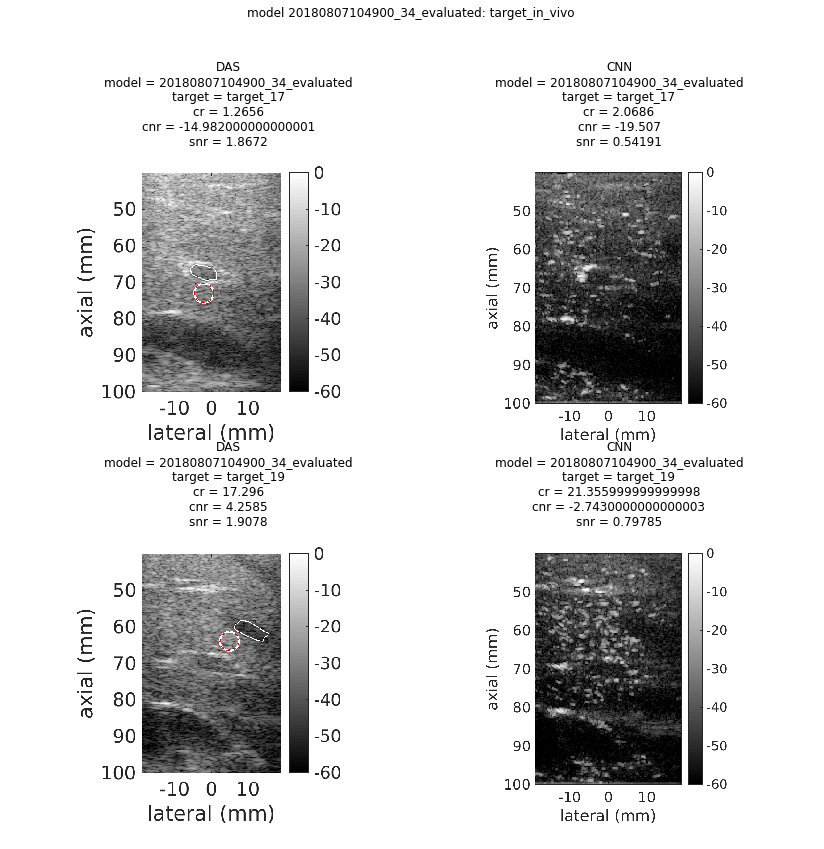

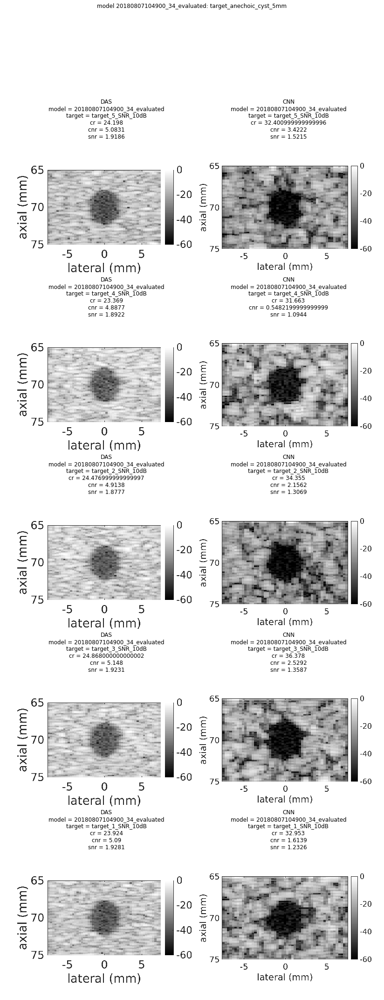

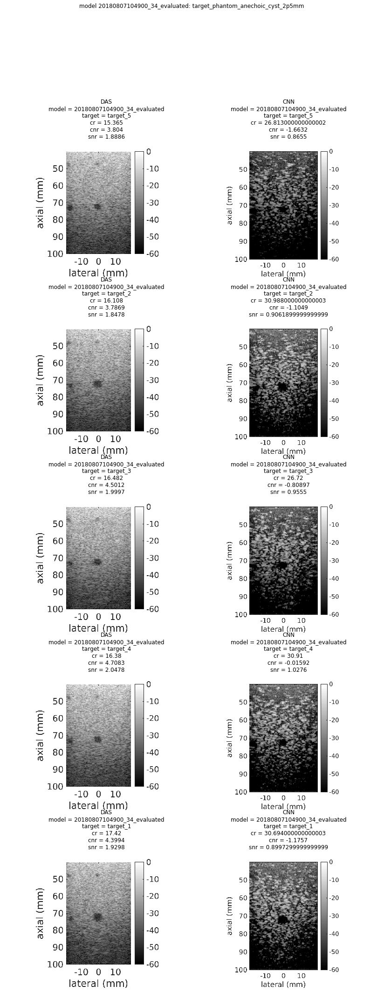





model 5 of 10 :  20180705164352_43_evaluated


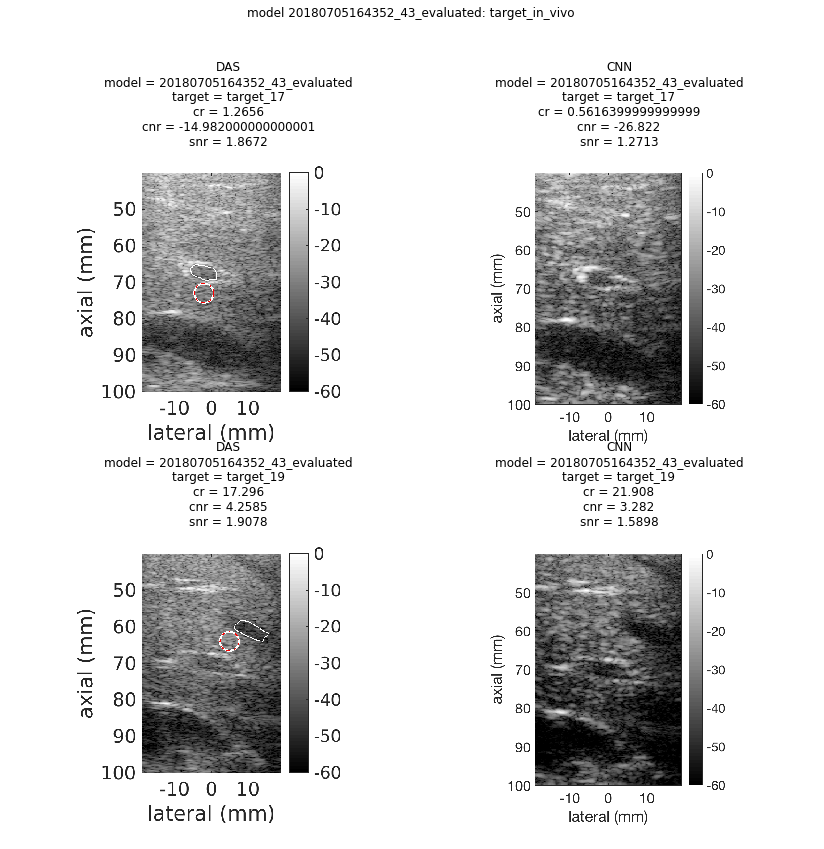

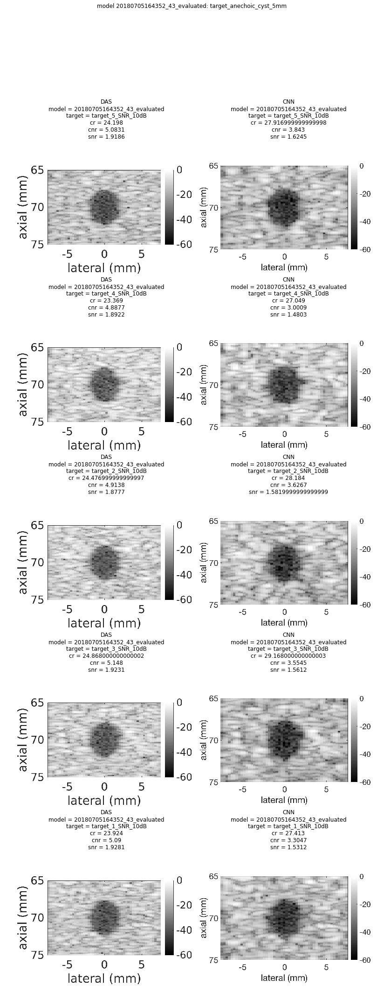

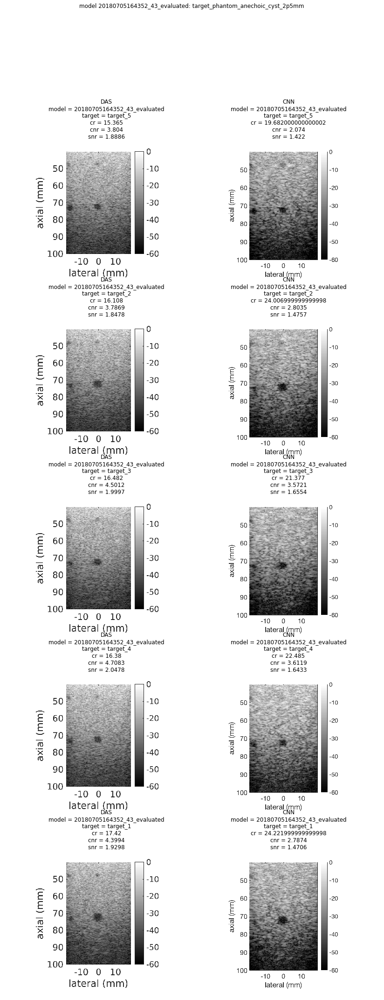





model 6 of 10 :  20181018100714_12_evaluated


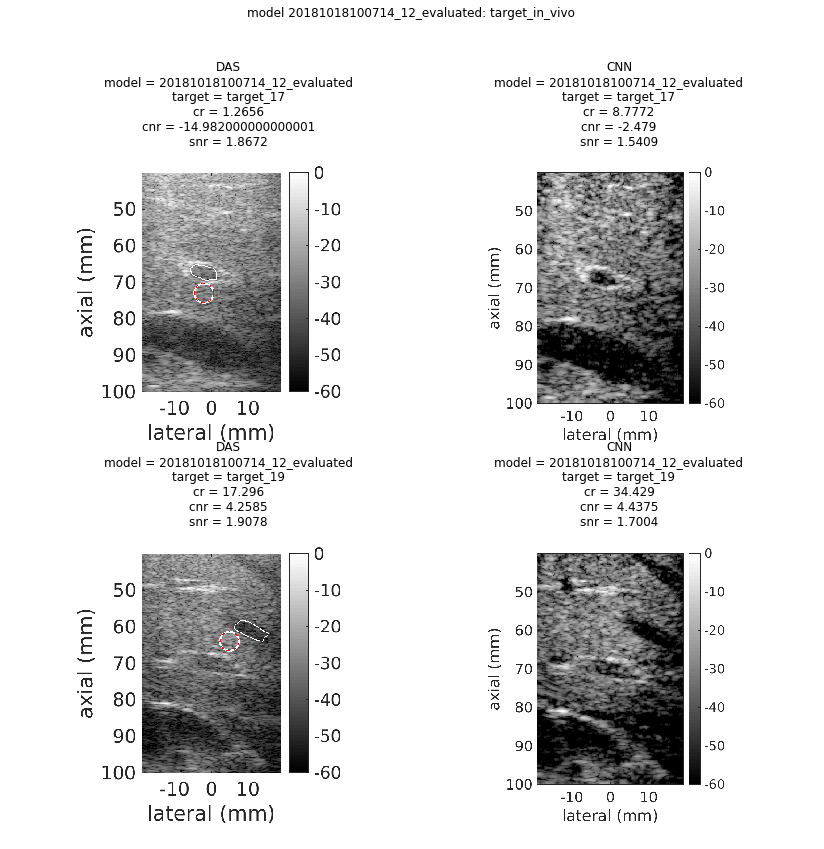

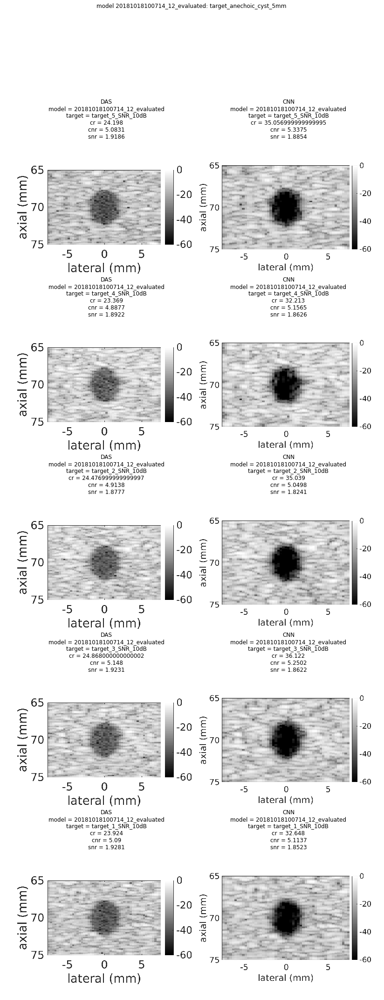

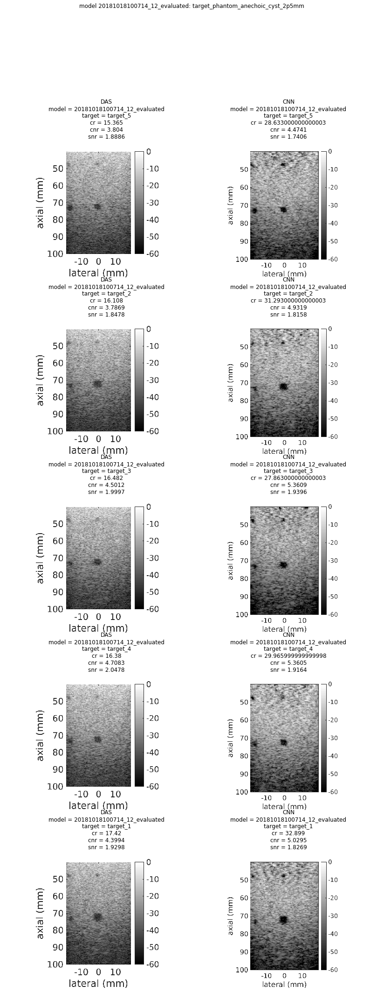





model 7 of 10 :  20181016023040_6_evaluated


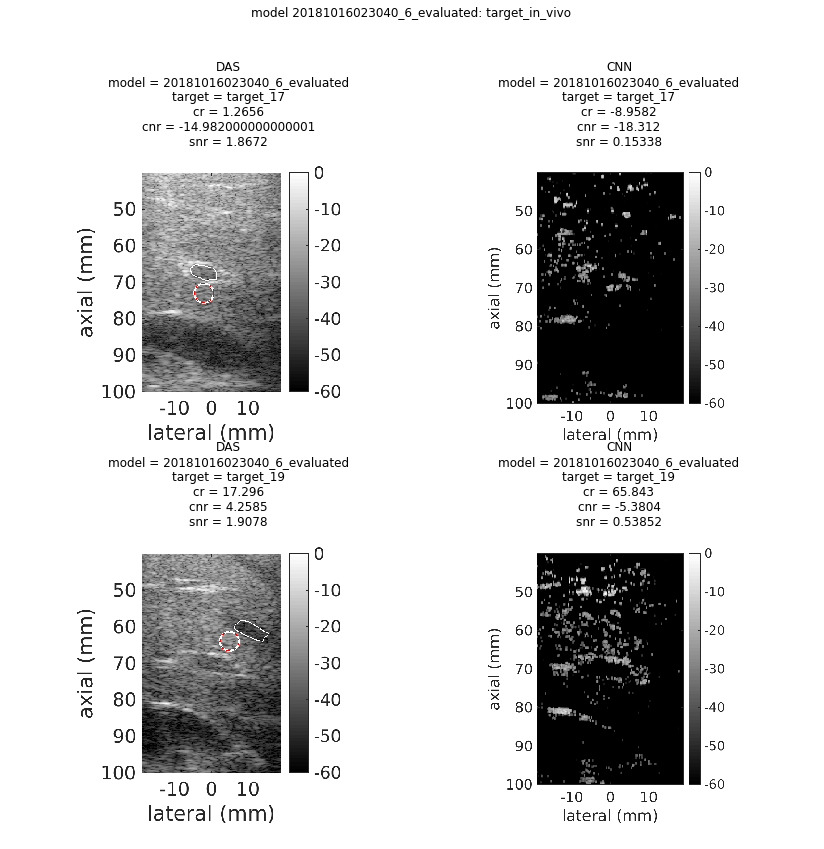

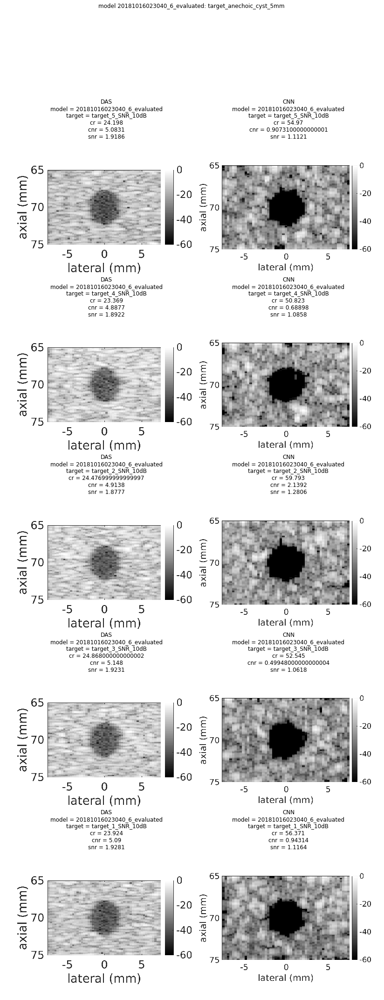

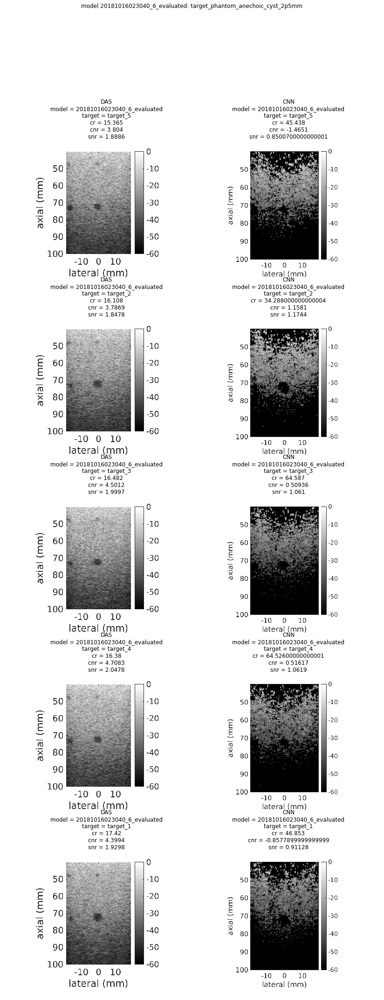





model 8 of 10 :  20181025215535_338_evaluated


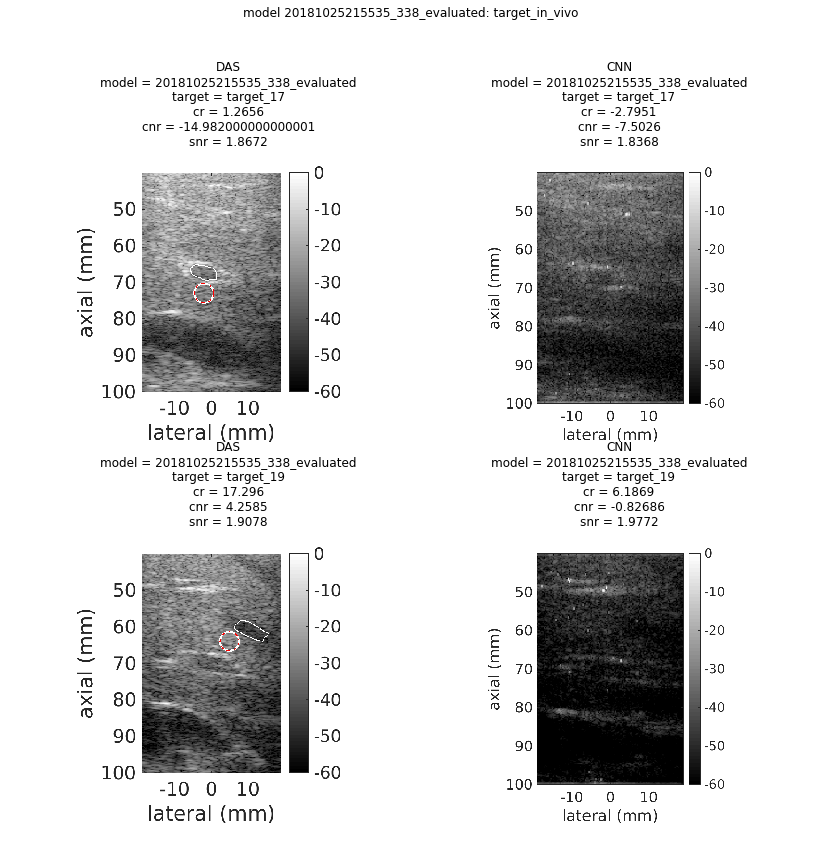

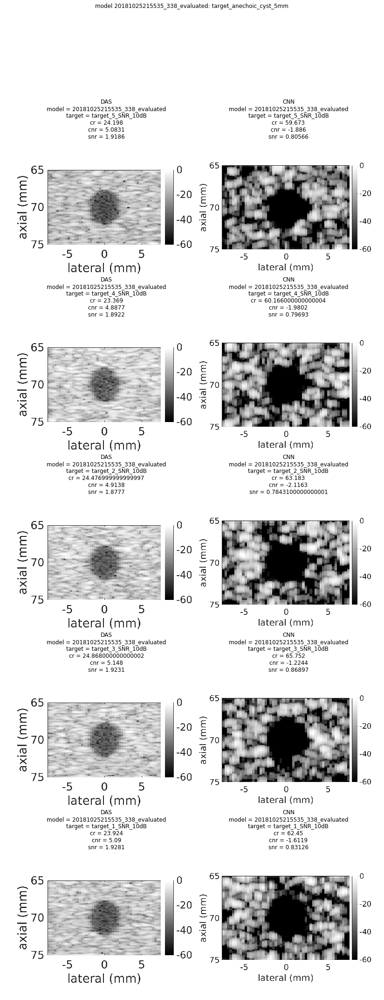

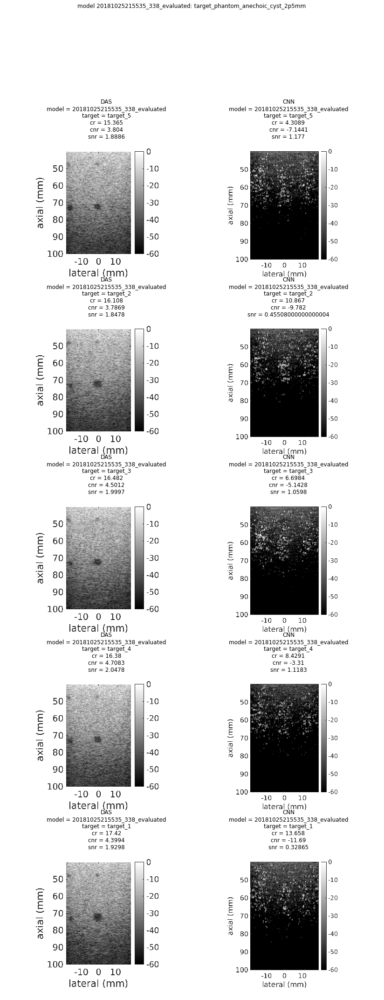





model 9 of 10 :  20180928201821_37_evaluated


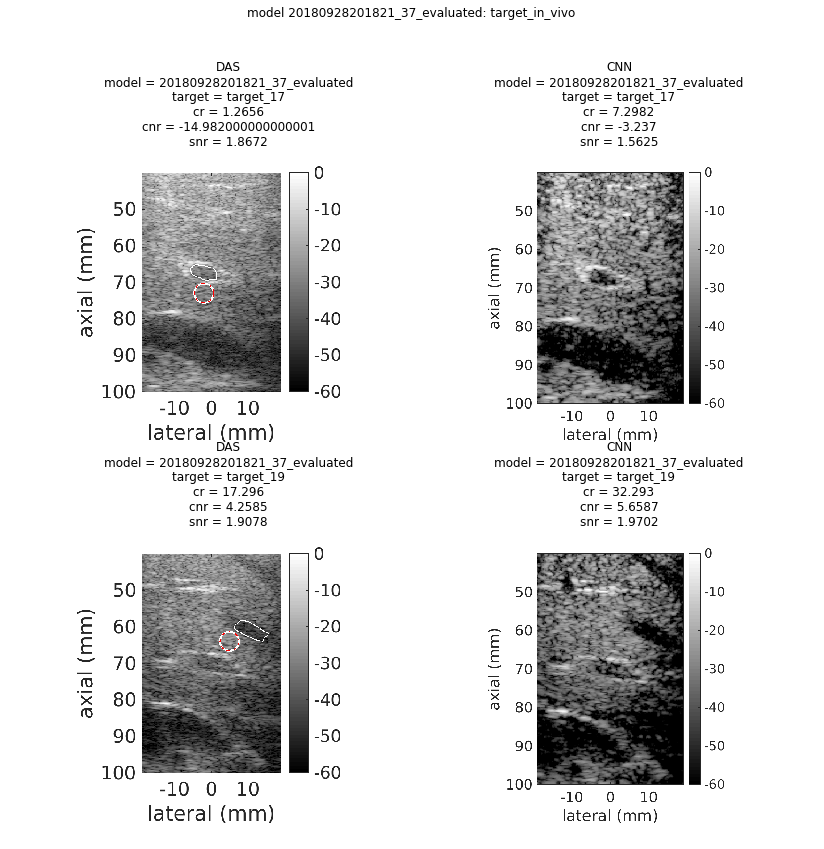

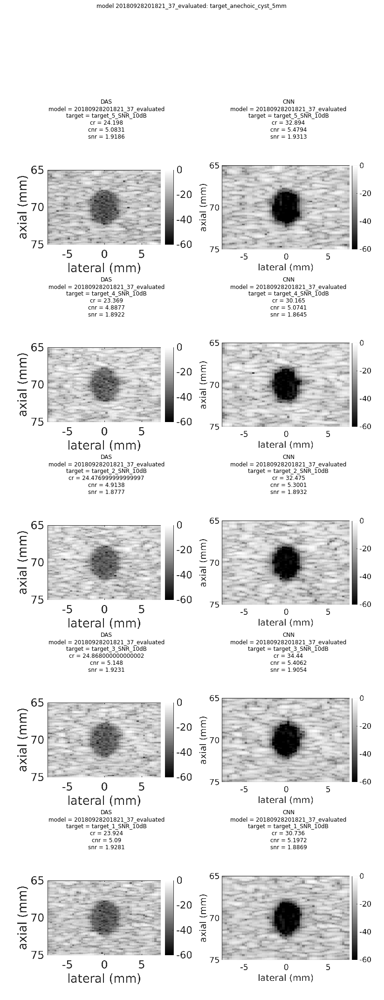

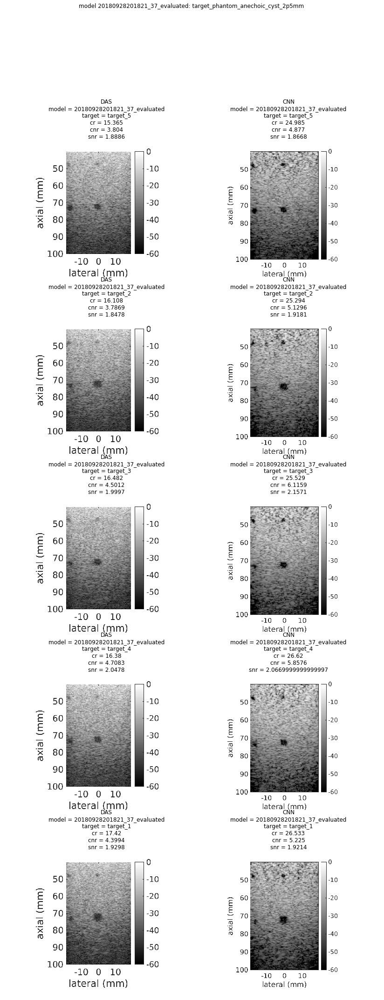





model 10 of 10 :  20181025215535_204_evaluated


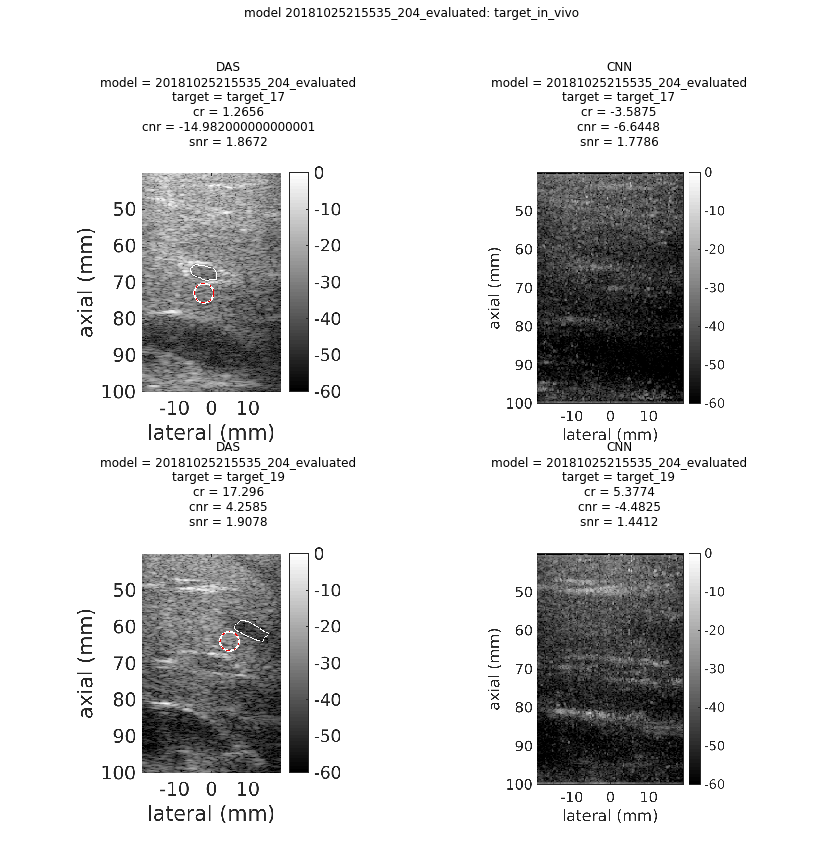

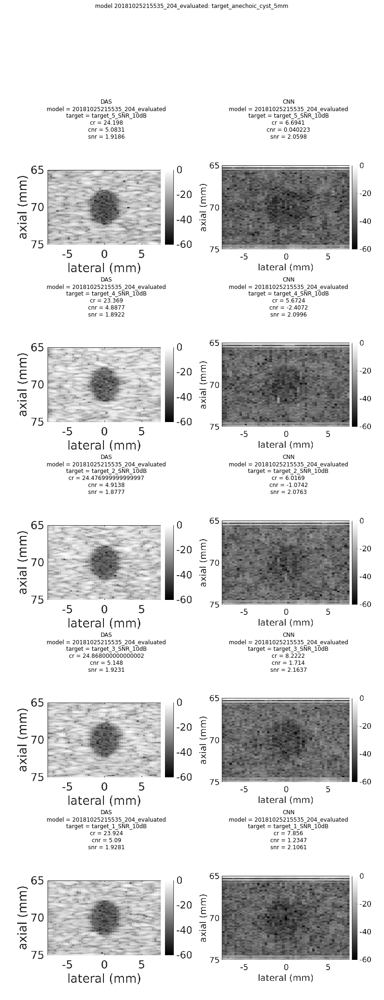

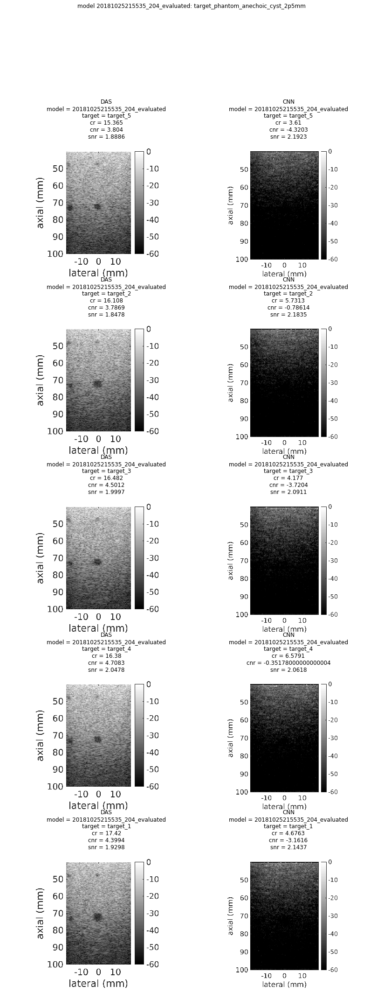

In [28]:
models_to_inspect = negative_1.head(10)

for index, model_name in enumerate(models_to_inspect['name']):
    model_folder = os.path.join('..', 'DNNs', model_name)
    print('model', index+1, 'of', len(models_to_inspect), ': ', model_name)
    inspect_model_by_name(model_folder, df)
    print('\n\n\n')

In [29]:
clustering.get_params()

{'algorithm': 'auto',
 'eps': 3,
 'leaf_size': 30,
 'metric': 'euclidean',
 'metric_params': None,
 'min_samples': 2,
 'n_jobs': 1,
 'p': None}